In [44]:
# Import packages
import numpy as np
import pandas as pd

pd.set_option("display.max_rows", 500)
pd.options.display.max_colwidth = 2500
pd.set_option("display.max_columns", None)

import sys
import os

from path import Path

import importlib
import matplotlib
import matplotlib.pyplot as plt
import re

DATASETS


In [33]:
# create coords dataframe

path = Path.joinpath(
    path_to_raw_data,
    "COSTA well_heads.csv",
)
logger.info(f"{path}")

data = pd.read_csv(path)
logger.info(f"shape: {data.shape}")
data.drop(
    columns=["Unnamed: 0", "Z_top", "Z_bottom", "YEAR", "KB", "TD", "TYPE"],
    inplace=True,
)

rename_dict = {"WELLNAME": "cat", "X": "x", "Y": "y"}
data.rename(columns=rename_dict, inplace=True)

logger.info(f"shape: {data.shape}")
data.head()

NameError: name 'path_to_raw_data' is not defined

In [4]:
#ITMO dataset

ITMO_data = pd.read_csv("C:\ИТМО\НИР\Code\Data\Archive\ITMO production data.csv")
rename_dict = {
    "datetime": "date",
    "Номер скважины": "cat",
    "Дебит нефти": "oil",
    "Дебит газа (ТМ)": "gas",
    "Дебит жидкости (ТМ)": "liquid",
    "Давление забойное": "bhp",
}

ITMO_data.rename(columns=rename_dict, inplace=True)

ITMO_data["cat"] = "p_" + ITMO_data["cat"].astype(str)

coords_df = ITMO_data.filter(["cat", "x", "y"]).drop_duplicates().reset_index(drop=True)
ITMO_data.drop(columns=["x", "y"], inplace=True)

ITMO_data["group"] = "P"
ITMO_data["choke"] = np.where(ITMO_data["liquid"] == 0, 0, 1)

display(ITMO_data.head())
display(ITMO_data.info())
display(ITMO_data.describe())

,date,cat,oil,bhp,Объем жидкости,Объем нефти,Активная мощность (ТМ),Время работы (ТМ),Газовый фактор рабочий (ТМ),Давление буферное,Давление забойное от Hд,Давление забойное от Pпр,Давление линейное (ТМ),Давление на входе ЭЦН (ТМ),gas,Дебит газа попутного,liquid,Коэффициент мощности (ТМ),group,choke
0,1990-08-01,p_0,19.939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,1
1,1990-08-02,p_0,19.939,39.064454,NaN,NaN,50.851351,9.600833,NaN,NaN,33.913336,39.064454,1.887872,30.293676,3843.746667,24.25,24.250000,98.534314,P,1
2,1990-08-03,p_0,21.172,39.064487,NaN,NaN,52.353846,NaN,NaN,NaN,33.806090,39.064487,1.885714,30.261774,3900.955000,25.75,25.833333,99.139785,P,1
3,1990-08-04,p_0,22.529,38.965297,NaN,NaN,51.242424,9.600000,NaN,NaN,33.695717,38.965297,1.875851,30.212768,3874.505000,27.40,27.933333,98.744318,P,1
4,1990-08-05,p_0,22.529,38.766822,NaN,NaN,50.910256,9.563889,NaN,NaN,33.695717,38.766822,1.873163,30.109119,3853.696667,27.40,27.400000,98.419689,P,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67136 entries, 0 to 67135
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         67136 non-null  object 
 1   cat                          67136 non-null  object 
 2   oil                          67136 non-null  float64
 3   bhp                          64756 non-null  float64
 4   Объем жидкости               3465 non-null   float64
 5   Объем нефти                  3465 non-null   float64
 6   Активная мощность (ТМ)       62412 non-null  float64
 7   Время работы (ТМ)            63475 non-null  float64
 8   Газовый фактор рабочий (ТМ)  25230 non-null  float64
 9   Давление буферное            10208 non-null  float64
 10  Давление забойное от Hд      65710 non-null  float64
 11  Давление забойное от Pпр     42297 non-null  float64
 12  Давление линейное (ТМ)       66796 non-null  float64
 13  Давление на вход

None

,oil,bhp,Объем жидкости,Объем нефти,Активная мощность (ТМ),Время работы (ТМ),Газовый фактор рабочий (ТМ),Давление буферное,Давление забойное от Hд,Давление забойное от Pпр,Давление линейное (ТМ),Давление на входе ЭЦН (ТМ),gas,Дебит газа попутного,liquid,Коэффициент мощности (ТМ),choke
count,67136.000000,64756.000000,3465.000000,3465.000000,62412.000000,63475.000000,2.523000e+04,10208.000000,65710.000000,42297.000000,66796.000000,58080.000000,3.313100e+04,51369.000000,59207.000000,64150.000000,67136.0
mean,10.800321,55.557363,868.940538,228.714451,63.314403,11.764883,3.721675e+03,17.667257,56.741535,53.890931,12.634232,110.896533,4.473275e+03,45.907012,46.105641,74.333500,1.0
std,8.894787,25.246486,1718.278736,298.633677,35.083264,6.898272,5.249838e+04,4.623137,26.109155,23.369594,6.874192,1522.380744,9.721568e+04,66.213294,334.426253,17.808299,0.0
min,0.003000,10.721637,0.000000,0.000000,0.100000,0.000278,5.000000e-03,4.500000,8.940458,10.173830,0.055986,0.082931,1.000000e-02,0.600000,0.055000,0.505000,1.0
25%,4.639000,36.395995,0.000000,0.000000,45.121233,6.481389,6.400000e+01,15.000000,36.655139,37.283891,8.191988,21.034099,1.966300e+02,15.000000,13.900000,62.300342,1.0
50%,8.811292,48.734214,417.875000,118.761000,56.583333,9.531389,2.066030e+02,18.000000,49.739009,45.863967,14.721667,30.225652,1.173987e+03,24.400000,22.933333,71.014493,1.0
75%,14.126000,71.681975,854.483000,359.405000,70.707411,15.659444,4.590322e+02,20.000000,72.997196,70.267356,17.173084,40.526165,4.039018e+03,41.250000,40.566667,89.739347,1.0
max,79.977000,167.062244,19494.782000,2514.044000,3378.897638,24.000000,5.747521e+06,37.000000,251.364405,167.062244,105.002992,327680.000000,1.459410e+07,582.000000,74293.175000,655.350000,1.0


In [64]:
ITMO_data.to_csv(index=False)

'date,cat,oil,bhp,Объем жидкости,Объем нефти,Активная мощность (ТМ),Время работы (ТМ),Газовый фактор рабочий (ТМ),Давление буферное,Давление забойное от Hд,Давление забойное от Pпр,Давление линейное (ТМ),Давление на входе ЭЦН (ТМ),gas,Дебит газа попутного,liquid,Коэффициент мощности (ТМ),group,choke\r\n1990-08-01,p_0,19.939,,,,,,,,,,,,,,,,P,1\r\n1990-08-02,p_0,19.939,39.06445414074,,,50.85135135135136,9.60083333333,,,33.91333552442,39.06445414074,1.887872340425529,30.29367647058824,3843.7466666666655,24.25,24.25,98.5343137254902,P,1\r\n1990-08-03,p_0,21.172,39.06448686624,,,52.35384615384616,,,,33.80608995312,39.06448686624,1.8857142857142843,30.261774193548387,3900.955,25.75,25.83333333333333,99.13978494623656,P,1\r\n1990-08-04,p_0,22.529,38.9652967523,,,51.24242424242424,9.6,,,33.69571724251,38.9652967523,1.875851063829788,30.21276836158192,3874.505,27.4,27.93333333333333,98.7443181818182,P,1\r\n1990-08-05,p_0,22.529,38.76682191624,,,50.9102564102564,9.56388888889,,,33.69571724251,38

In [63]:
coords_df.head(10)

,cat,x,y
0,p_0,18670.86,5714.86
1,p_1,19964.69,10000.63
2,p_2,20541.78,9806.47
3,p_3,12578.90,7805.61
4,p_4,9828.65,18016.98
5,p_5,18713.19,9731.53
6,p_6,12146.24,22686.24
7,p_7,9427.28,18515.75
8,p_8,19494.13,8660.68
9,p_9,13713.11,6761.05


In [65]:
coords_df.to_csv(index=False)

'cat,x,y\r\np_0,18670.859999999982,5714.860000000334\r\np_1,19964.69,10000.629999999888\r\np_2,20541.77999999997,9806.46999999974\r\np_3,12578.899999999963,7805.610000000334\r\np_4,9828.649999999963,18016.98000000045\r\np_5,18713.19,9731.53000000026\r\np_6,12146.23999999999,22686.240000000224\r\np_7,9427.279999999972,18515.75\r\np_8,19494.130000000005,8660.679999999702\r\np_9,13713.109999999986,6761.049999999815\r\np_10,10209.969999999972,19439.33999999985\r\np_11,10842.199999999952,18253.30999999959\r\np_12,10829.419999999984,17523.049999999814\r\np_13,19750.90999999997,9168.53000000026\r\np_14,13544.309999999998,6008.089999999851\r\np_15,10803.26999999996,13702.53000000026\r\np_16,11455.619999999995,23154.969999999743\r\np_17,14960.919999999984,6996.94000000041\r\np_18,16940.909999999974,21812.41000000015\r\np_19,14864.059999999998,18137.620000000108\r\np_20,11626.949999999952,19643.91000000015\r\np_21,10029.130000000005,14059.19000000041\r\np_22,11193.619999999995,7788.120000000113\

In [5]:
#COSTA Dataset

COSTA_data = pd.read_csv("C:\ИТМО\НИР\Code\Data\Archive\COSTA well_heads.csv")

COSTA_data.drop(
    columns=["Unnamed: 0", "Z_top", "Z_bottom", "YEAR", "KB", "TD", "TYPE"],
    inplace=True,
)

rename_dict = {"WELLNAME": "cat", "X": "x", "Y": "y"}
COSTA_data.rename(columns=rename_dict, inplace=True)

display(COSTA_data.head())
display(COSTA_data.info())
display(COSTA_data.describe())

,cat,x,y
0,Inj-1,49374.998177,75374.998596
1,Inj-2,49374.998177,77874.996691
2,Inj-3,54374.999129,75374.998596
3,Inj-4,54374.999129,77874.996691
4,Inj-5,44374.998415,75374.998596


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 430 entries, 0 to 429
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   cat     430 non-null    object 
 1   x       430 non-null    float64
 2   y       430 non-null    float64
dtypes: float64(2), object(1)
memory usage: 10.2+ KB


None

,x,y
count,430.000000,430.000000
mean,47544.184494,76333.137114
std,9121.572976,10391.897565
min,30624.999070,56374.998161
25%,40624.998891,68187.497524
50%,46874.997701,76499.997501
75%,54249.998987,84124.996691
max,68624.997558,98124.997215


In [52]:
#Volve dataset

Volve_data = pd.read_excel("C:\ИТМО\НИР\Code\Data\Archive\Volve production data.xlsx", sheet_name="Daily Production Data")

Volve_data.dropna(axis=1, how="all", inplace=True)


Volve_data.columns = [col.lower() for col in Volve_data.columns]

drop_cols = [c for c in list(Volve_data) if Volve_data[c].nunique() <= 1]


Volve_data.drop(columns=drop_cols, inplace=True)

display(Volve_data.head())
display(Volve_data.info())


,dateprd,well_bore_code,npd_well_bore_code,npd_well_bore_name,on_stream_hrs,avg_downhole_pressure,avg_downhole_temperature,avg_dp_tubing,avg_annulus_press,avg_choke_size_p,avg_whp_p,avg_wht_p,dp_choke_size,bore_oil_vol,bore_gas_vol,bore_wat_vol,bore_wi_vol,flow_kind,well_type
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,0.0,0.00000,0.00000,0.00000,0.0,0.000000,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,0.0,NaN,NaN,NaN,0.0,1.003059,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,0.0,NaN,NaN,NaN,0.0,0.979008,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,0.0,NaN,NaN,NaN,0.0,0.545759,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,0.0,310.37614,96.87589,277.27826,0.0,1.215987,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15832 entries, 0 to 15831
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   dateprd                   15832 non-null  datetime64[ns]
 1   well_bore_code            15832 non-null  object        
 2   npd_well_bore_code        15832 non-null  int64         
 3   npd_well_bore_name        15832 non-null  object        
 4   on_stream_hrs             15547 non-null  float64       
 5   avg_downhole_pressure     9178 non-null   float64       
 6   avg_downhole_temperature  8980 non-null   float64       
 7   avg_dp_tubing             8980 non-null   float64       
 8   avg_annulus_press         7890 non-null   float64       
 9   avg_choke_size_p          8919 non-null   float64       
 10  avg_whp_p                 9353 non-null   float64       
 11  avg_wht_p                 9146 non-null   float64       
 12  dp_choke_size     

None

In [53]:
Volve_data["npd_well_bore_name"].unique()

array(['15/9-F-1 C', '15/9-F-11', '15/9-F-12', '15/9-F-14', '15/9-F-15 D',
       '15/9-F-4', '15/9-F-5', '15/9-F-15'], dtype=object)

In [54]:
Volve_data = Volve_data[
    ~((Volve_data["well_type"] == "WI") & (Volve_data["npd_well_bore_name"] == "15/9-F-1 C"))
]
Volve_data = Volve_data[~((Volve_data["well_type"] == "OP") & (Volve_data["npd_well_bore_name"] == "15/9-F-5"))]
Volve_data = Volve_data[~(Volve_data["npd_well_bore_name"] == "15/9-F-15")]

In [58]:
Volve_data[["data"]["cat"]] = Volve_data.apply(
    lambda x: re.split("-", x["npd_well_bore_name"])[1]
    + "-"
    + re.split("-", x["npd_well_bore_name"])[2],
    axis=1,
)
dictionary = dict(zip(Volve_data["npd_well_bore_name"], Volve_data[['data']['cat']]))
print(dictionary)
Volve_data.drop(
    columns=["well_bore_code", "npd_well_bore_code", "npd_well_bore_name", "flow_kind"],
    inplace=True,
)

Volve_data.rename(
    columns={"well_type": "group", "dateprd": "date"},
    inplace=True,
)
Volve_data.reset_index(drop=True, inplace=True)
Volve_data.head()

<>:1: SyntaxWarning: list indices must be integers or slices, not str; perhaps you missed a comma?
<>:7: SyntaxWarning: list indices must be integers or slices, not str; perhaps you missed a comma?
<>:1: SyntaxWarning: list indices must be integers or slices, not str; perhaps you missed a comma?
<>:7: SyntaxWarning: list indices must be integers or slices, not str; perhaps you missed a comma?
C:\Users\Dell\AppData\Local\Temp\ipykernel_30512\3499200500.py:1: SyntaxWarning: list indices must be integers or slices, not str; perhaps you missed a comma?
  Volve_data[["data"]["cat"]] = Volve_data.apply(


TypeError: list indices must be integers or slices, not str

In [ ]:
d = {
    "15/9-F-4": (435654.01, 6477677.22),
    "15/9-F-5": (436403.89, 6478703.6),
    "15/9-F-14": (436028.94, 6478876.54),
    "15/9-F-1 C": (435584.78, 6479497.27),
    "15/9-F-11": (436551.57, 6478399.73),
    "15/9-F-12": (435335.51, 6478201.54),
    "15/9-F-15 D": (436650.23, 6478716.35),
    "15/9-F-15": (434105.85, 6476758.93),
}
df = pd.DataFrame.from_dict(d).T
df.reset_index(inplace=True)
df.columns = ["NPD_WELL_BORE_NAME", "x", "y"]

df['cat'] = df['NPD_WELL_BORE_NAME'].map(dictionary)


In [40]:
#Waterflood
def get_train():
    df = pd.read_csv("./Data/waterflood-master/waterflood-master/data/train/train_data.csv")
    df['MEASURED_IN_DATE'] = pd.to_datetime(df['MEASURED_IN_DATE'])
    df['MEASURED_IN'] = pd.to_datetime(df['MEASURED_IN'])
    df['KCHARWORK'] = df['KCHARWORK'].astype(int).astype('object')
    print(df.shape)
    print(df["WELL_NAME"].nunique())
    return df

df = get_train()

df.head()

(177575, 11)
266


,MEASURED_IN_DATE,WELL_NAME,KCHARWORK,CHARWORK,MEASURED_IN,LIQ_RATE,WATER_CUT,P_ZAB,INTAKE,WELLHEAD_PRESSURE,IS_WORKING
0,2017-02-01,9e4912342a7d40c2a7bcd2f62852ad91ea0923333d0f557801cefe2a4731ce6e,20,НАГ,2017-02-01 12:00:00,0.0,0.0,NaN,225.0,150.0,True
1,2017-02-02,9e4912342a7d40c2a7bcd2f62852ad91ea0923333d0f557801cefe2a4731ce6e,20,НАГ,2017-02-02 00:00:00,0.0,0.0,NaN,225.0,150.0,True
2,2017-02-03,9e4912342a7d40c2a7bcd2f62852ad91ea0923333d0f557801cefe2a4731ce6e,20,НАГ,2017-02-03 00:00:00,0.0,0.0,NaN,225.0,150.0,True
3,2017-02-04,9e4912342a7d40c2a7bcd2f62852ad91ea0923333d0f557801cefe2a4731ce6e,20,НАГ,2017-02-04 00:00:00,0.0,0.0,NaN,225.0,150.0,True
4,2017-02-05,9e4912342a7d40c2a7bcd2f62852ad91ea0923333d0f557801cefe2a4731ce6e,20,НАГ,2017-02-05 00:00:00,0.0,0.0,NaN,225.0,150.0,True


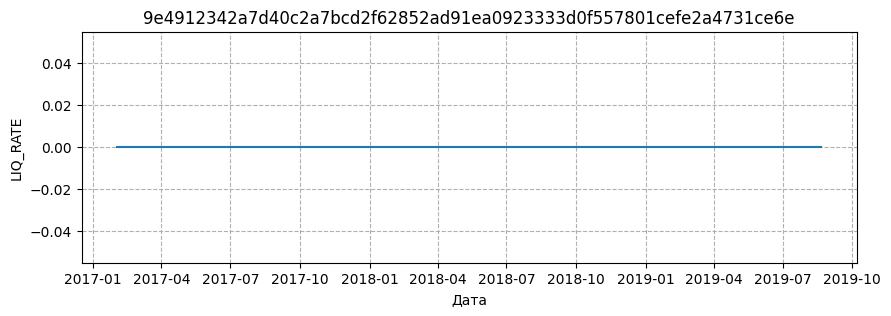

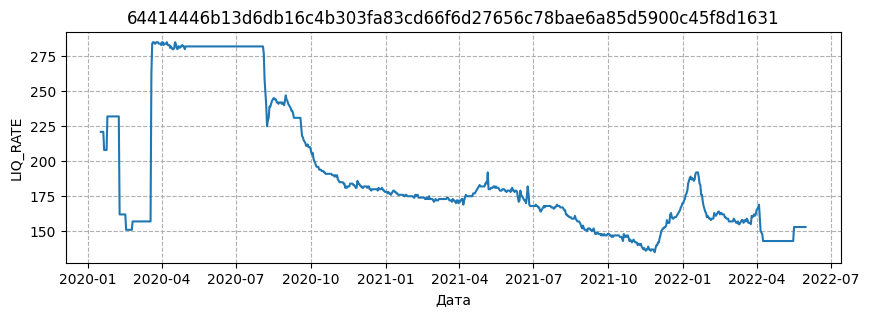

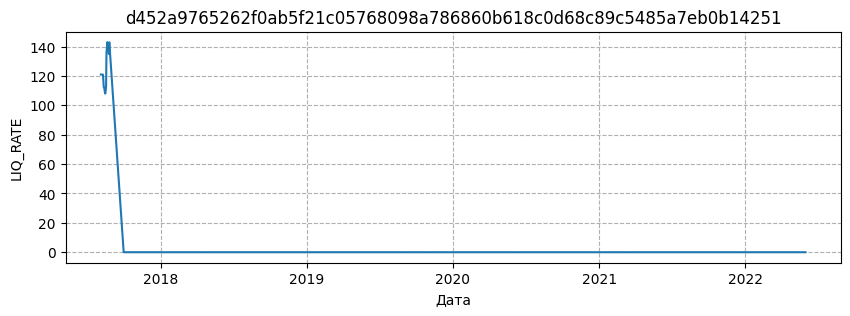

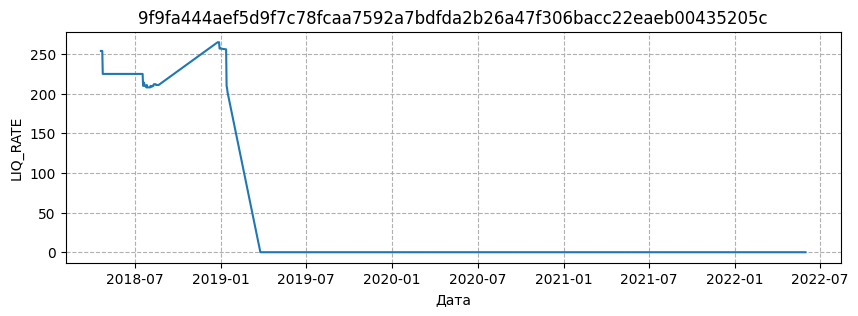

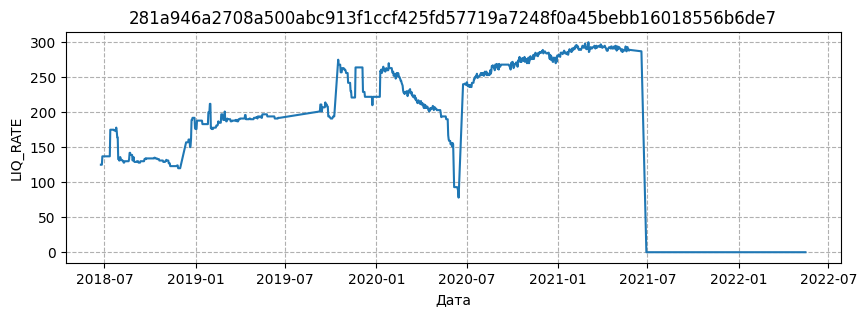

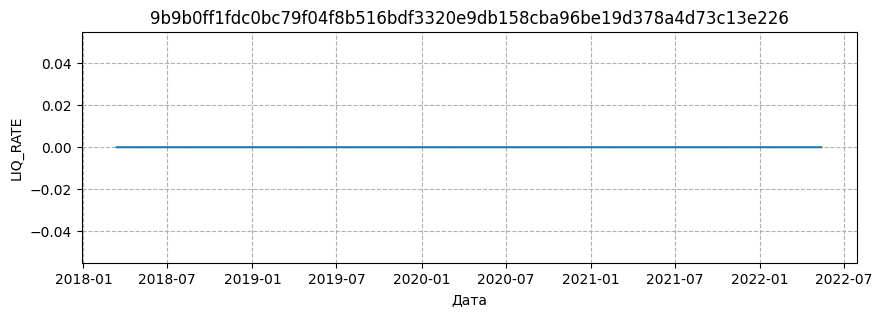

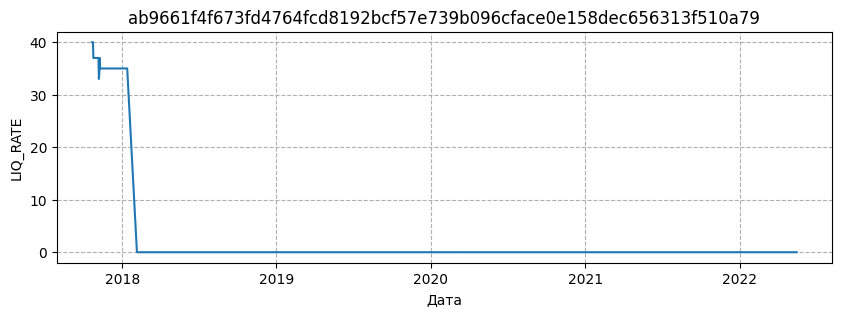

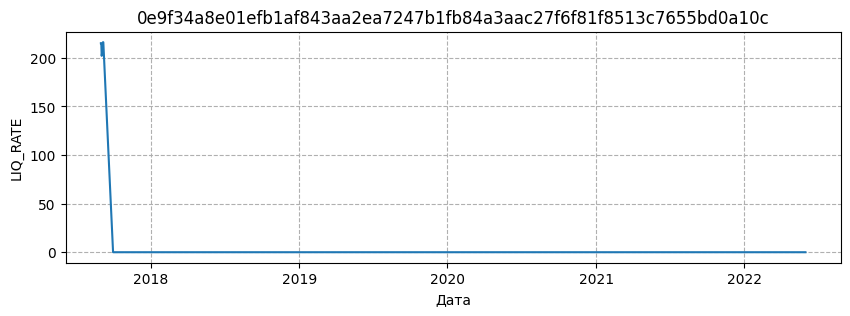

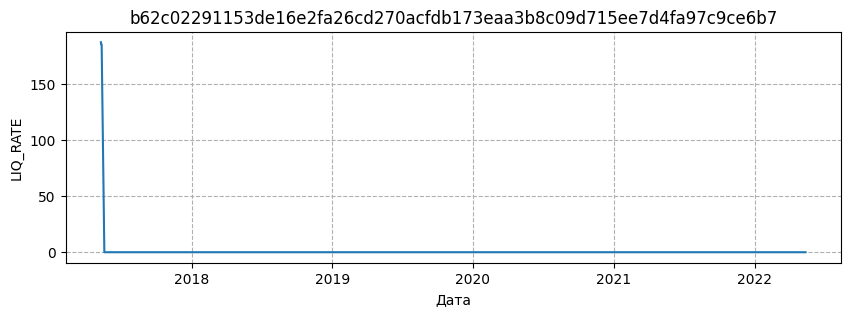

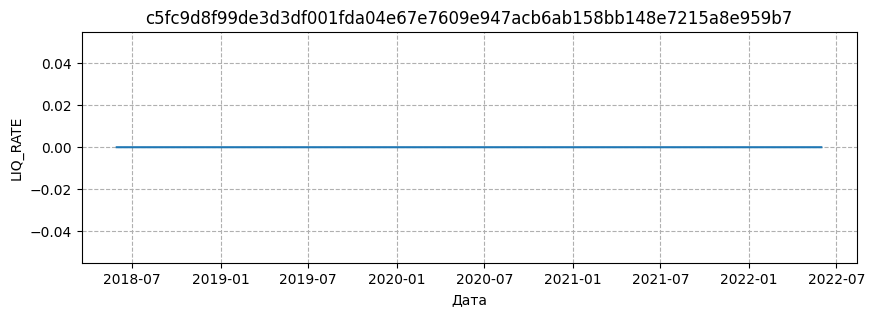

In [43]:
param = "LIQ_RATE"

for well in df['WELL_NAME'].unique()[:10]:
    tmp = df[df['WELL_NAME'] == well]
    plt.figure(figsize=(10, 3))
    
    plt.plot(tmp["MEASURED_IN_DATE"], tmp[param])
    plt.grid(ls="--")
    plt.title(well)
    plt.xlabel("Дата")
    plt.ylabel(param)

In [44]:
grouped_df = df.groupby(["WELL_NAME"], as_index=True).agg({"CHARWORK": ["unique"]})
grouped_df.columns = ["_".join(x).rstrip("_") for x in grouped_df.columns.ravel()]
grouped_df["CHARWORK_unique"] = [
    ",".join(map(str, l)) for l in grouped_df["CHARWORK_unique"]
]
grouped_df.head()

,CHARWORK_unique
WELL_NAME,
02567341ea1c840299c4a0b74a8cd59dff5b1dd2af69ddd253c0938443317eb8,"НЕФ,НАГ"
0471418bf3f22977041f4016205e646cba1214e82e6d636d4f7abfe3eb00dbd9,НЕФ
05e1e718d93d96a73e6ddb6a307fe5de60fc53249d760cd81b13a6e7255d708e,НЕФ
06252c150957a6ca28111b094eb923bfa74d2a66928655e9cb7cb671ed159ecf,"НЕФ,НАГ"
067468377b3cf69697d91de11e79d036135ceff0a601655e9f5c78bda3818b9c,НЕФ


In [45]:
df.groupby(
    [
        "WELL_NAME",
        "CHARWORK",
        "KCHARWORK",
    ],
    as_index=True,
).agg({"MEASURED_IN_DATE": ["count"]}).head()

MEASURED_IN_DATE
                                                                                               count
WELL_NAME                                                        CHARWORK KCHARWORK                 
02567341ea1c840299c4a0b74a8cd59dff5b1dd2af69ddd253c0938443317eb8 НАГ      20                     616
                                                                 НЕФ      11                     150
0471418bf3f22977041f4016205e646cba1214e82e6d636d4f7abfe3eb00dbd9 НЕФ      11                     419
05e1e718d93d96a73e6ddb6a307fe5de60fc53249d760cd81b13a6e7255d708e НЕФ      11                     441
06252c150957a6ca28111b094eb923bfa74d2a66928655e9cb7cb671ed159ecf НАГ      20                    1215

In [55]:
def get_coords():
    df = pd.read_csv("./Data/waterflood-master/waterflood-master/data/train/coords.csv")
    print(df.shape)
    print(df["WELL_NAME"].nunique())
    return df

coords = get_coords()

coords = coords[coords["WELL_NAME"].isin(df["WELL_NAME"].unique())]
print(coords.shape)
print(coords["WELL_NAME"].nunique())

coords = pd.merge(coords, grouped_df, on="WELL_NAME", how="left")

display(coords.head())
display(coords.info())

(424, 5)
424
(266, 5)
266


,WELL_NAME,COORD_X,COORD_Y,X2,Y2,CHARWORK_unique
0,769384f0a6fe5cba75fc68a9e52395eb9b69fa8dab849ef795694a92183121c9,11611.72,3450.28,11769.95,2921.20,НЕФ
1,59e8ab92b257d0809933a49847143f08b2143d238856e8e0286530ea0f677637,14147.72,4947.28,13926.47,5554.19,НЕФ
2,281a946a2708a500abc913f1ccf425fd57719a7248f0a45bebb16018556b6de7,11009.72,8856.28,11029.73,8939.46,"НЕФ,НАГ"
3,6ab87d3e097b485c5bdd13b3940ec9c160fe5e77163d2e38ab41680a0dee875f,13982.72,6816.28,13947.17,6771.63,НАГ
4,488e60d7575cbd8757674c7e03a8a736a90a5d1245a4ce03375c26702d7a209b,14170.72,6362.28,14229.18,6398.64,"НЕФ,НАГ"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   WELL_NAME        266 non-null    object 
 1   COORD_X          266 non-null    float64
 2   COORD_Y          266 non-null    float64
 3   X2               266 non-null    float64
 4   Y2               266 non-null    float64
 5   CHARWORK_unique  266 non-null    object 
dtypes: float64(4), object(2)
memory usage: 12.6+ KB


None

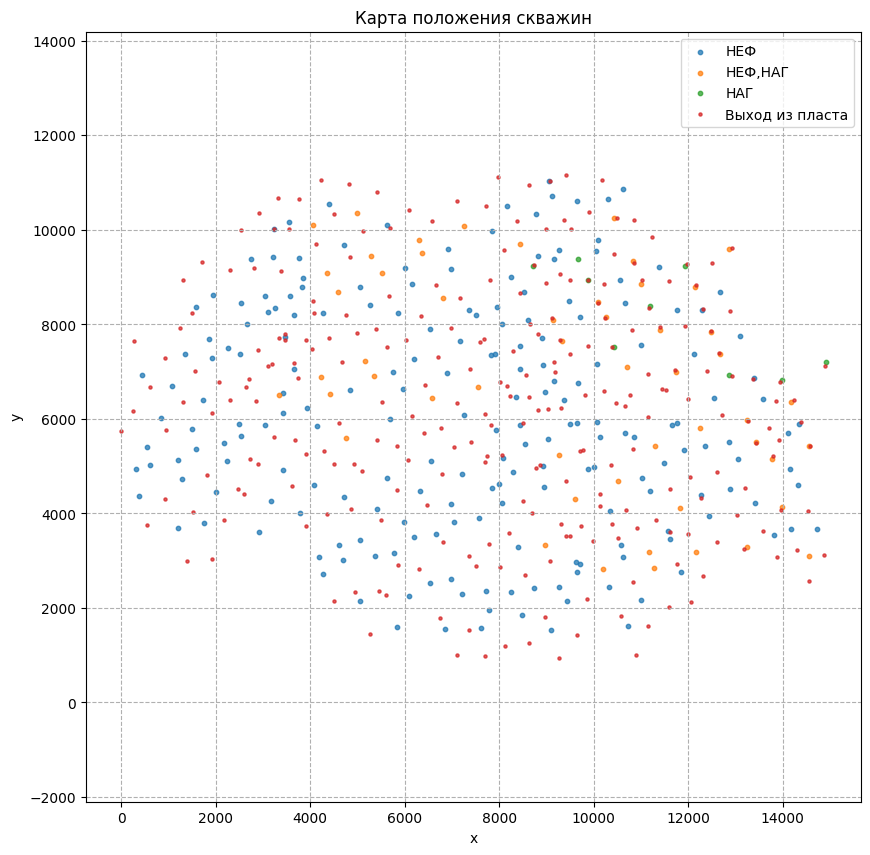

In [53]:
plt.figure(figsize=(10, 10))

for well_type in coords["CHARWORK_unique"].unique():
    tmp = coords[coords["CHARWORK_unique"] == well_type].copy()
    plt.scatter(
        tmp["COORD_X"],
        tmp["COORD_Y"],
        label = well_type,
        s = 10,
        alpha = 0.75
    )

plt.scatter(coords["X2"], coords["Y2"], label="Выход из пласта", s = 5, alpha = 0.75)

plt.title("Карта положения скважин")
plt.axis("equal")
plt.grid(ls="--")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()

In [54]:
def get_gtm():
    df = pd.read_csv("./Data/waterflood-master/waterflood-master/data/train/gtm.csv")
    df["START_DATE_FACT"] = pd.to_datetime(df["START_DATE_FACT"])
    df["END_DATE_FACT"] = pd.to_datetime(df["END_DATE_FACT"])
    
    print(df.shape)
    print(df['WELL_NAME'].nunique())
    
    return df

gtm = get_gtm()

gtm = gtm[gtm["WELL_NAME"].isin(df["WELL_NAME"].unique())]

print(gtm.shape)
print(gtm["WELL_NAME"].nunique())

gtm.head()

(577, 4)
368
(417, 4)
266


,WELL_NAME,GEOTECH_ACTION,START_DATE_FACT,END_DATE_FACT
0,7f19ddcfcd2d874f2cf0dc982fccd173de21e99e87488ffc4c06b9565713eea9,Из бурения,2020-10-03,2020-10-06
1,613f15a5a89a63c1f6e61ea5466461b46c8168e91c329345e4e1b0dff2bbb705,Из бурения,2020-07-01,2020-08-12
2,879329a0f238b019636f868a76bcbca2114b2b4135938f05efd60a12e6a79a2b,ИДН,2020-01-22,2020-01-28
3,a0cee26b395d55edbcc8ba5eb5f0c88d7b584ba2c5e318fc0e58bfbe83dd4d0b,Из бурения,2020-11-14,2020-12-13
4,56deb052231234f854d9258f05d17ed2ad8727e2d6e63a7b15ff6c4bb6867290,Из бурения,2020-11-17,2020-12-13


In [56]:
#Единые данные по скважинам

wells = pd.merge(coords, gtm, on="WELL_NAME", how="left")

display(wells.head())
display(wells.info())

,WELL_NAME,COORD_X,COORD_Y,X2,Y2,CHARWORK_unique,GEOTECH_ACTION,START_DATE_FACT,END_DATE_FACT
0,769384f0a6fe5cba75fc68a9e52395eb9b69fa8dab849ef795694a92183121c9,11611.72,3450.28,11769.95,2921.20,НЕФ,Из бурения,2018-09-08,2018-09-10
1,769384f0a6fe5cba75fc68a9e52395eb9b69fa8dab849ef795694a92183121c9,11611.72,3450.28,11769.95,2921.20,НЕФ,ИДН,2021-03-20,2021-03-25
2,59e8ab92b257d0809933a49847143f08b2143d238856e8e0286530ea0f677637,14147.72,4947.28,13926.47,5554.19,НЕФ,ИДН,2020-10-04,2020-10-08
3,59e8ab92b257d0809933a49847143f08b2143d238856e8e0286530ea0f677637,14147.72,4947.28,13926.47,5554.19,НЕФ,Из бурения,2018-08-08,2018-08-28
4,281a946a2708a500abc913f1ccf425fd57719a7248f0a45bebb16018556b6de7,11009.72,8856.28,11029.73,8939.46,"НЕФ,НАГ",ОПЗ,2020-06-15,2020-06-21


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417 entries, 0 to 416
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   WELL_NAME        417 non-null    object        
 1   COORD_X          417 non-null    float64       
 2   COORD_Y          417 non-null    float64       
 3   X2               417 non-null    float64       
 4   Y2               417 non-null    float64       
 5   CHARWORK_unique  417 non-null    object        
 6   GEOTECH_ACTION   417 non-null    object        
 7   START_DATE_FACT  417 non-null    datetime64[ns]
 8   END_DATE_FACT    417 non-null    datetime64[ns]
dtypes: datetime64[ns](2), float64(4), object(3)
memory usage: 29.4+ KB


None